# Preprocessing Pipeline

## Create folder structures

**Prerequisites:**
- Existing folders and files in root directory:
    - `./data/raw-train/images/`
    - `./data/raw-train/tiger-coco.json`
    - `/data/raw-test/images/`
    - `/data/raw-test/masks/`
    - `./data/processed-train/`
    - `/data/processed-test/`

In [1]:
import os

# Directories
dirs = [
    "./data/processed-train/hematoxylin_eq",
    "./data/processed-train/normalized_eq",
    "./data/processed-train/eq",
    "./data/processed-train/patches",
    "./data/processed-train/masks",
    "./data/processed-test/binary_masks",
    "./data/processed-test/scaled",
    "./data/processed-test/patches"
]

for directory in dirs:
    os.makedirs(directory, exist_ok=True)

In [2]:
from src.image_preprocessor import ImageProcessor, InplaceOption

# Initialize processors
train_processor = ImageProcessor("./data/raw-train/images")
test_processor = ImageProcessor("./data/raw-test/images")

## Select reference images for normalization

In [3]:
train_target = train_processor.select_random_images(8)
test_target = test_processor.select_random_images(2)
targets = train_target + test_target

## Generate pseudo-masks for training set

In [4]:
# Normalize train set and separate hematoxylin and eosin stains and save the hematoxylin images into the object
train_processor.normalize(targets, out_dir="./data/processed-train", inplace=True, inplace_option=InplaceOption.HEMATOXYLIN)

[{'img_name': 'TCGA-A7-A4SE-01Z-00-DX1.16BC8401-E40E-4A1A-9BD9-12735C9AE3F6_[25889, 6170, 26037, 6310].png',
  'norm_image': array([[[147, 101, 133],
          [148, 102, 133],
          [140,  92, 123],
          ...,
          [181, 150, 194],
          [183, 153, 197],
          [193, 168, 207]],
  
         [[151, 105, 134],
          [141,  92, 122],
          [132,  83, 113],
          ...,
          [167, 131, 178],
          [183, 153, 195],
          [194, 169, 208]],
  
         [[142,  92, 116],
          [129,  78, 104],
          [137,  88, 114],
          ...,
          [168, 132, 179],
          [181, 150, 194],
          [188, 160, 201]],
  
         ...,
  
         [[138,  88, 111],
          [128,  77, 102],
          [142,  92, 117],
          ...,
          [189, 158, 182],
          [183, 148, 173],
          [183, 149, 174]],
  
         [[141,  91, 115],
          [142,  92, 116],
          [155, 109, 132],
          ...,
          [196, 169, 194],
          [17

In [5]:
# Perform histogram equalization on the hematoxylin images
train_processor.equalize_hist(out_dir="./data/processed-train/hematoxylin_eq")

[{'img_name': 'TCGA-A7-A4SE-01Z-00-DX1.16BC8401-E40E-4A1A-9BD9-12735C9AE3F6_[25889, 6170, 26037, 6310].png',
  'equalized_img': array([[[ 58,  43,  48],
          [ 55,  41,  45],
          [ 41,  29,  33],
          ...,
          [240, 230, 234],
          [243, 233, 237],
          [248, 243, 245]],
  
         [[ 53,  40,  44],
          [ 35,  25,  28],
          [ 26,  18,  20],
          ...,
          [220, 203, 209],
          [239, 229, 233],
          [249, 244, 246]],
  
         [[ 23,  15,  18],
          [ 10,   6,   7],
          [ 23,  15,  18],
          ...,
          [225, 208, 214],
          [240, 230, 234],
          [244, 235, 239]],
  
         ...,
  
         [[ 16,  10,  12],
          [ 10,   6,   7],
          [ 24,  16,  19],
          ...,
          [188, 167, 174],
          [152, 131, 138],
          [152, 132, 138]],
  
         [[ 21,  14,  16],
          [ 23,  15,  18],
          [ 45,  33,  37],
          ...,
          [217, 199, 206],
          

In [6]:
# Set the normalized images to the object and perform histogram equalization on them
train_processor.set_images_from_dir(images_dir="./data/processed-train/normalized")
train_processor.equalize_hist(out_dir="./data/processed-train/normalized_eq")

[{'img_name': 'TCGA-A7-A4SE-01Z-00-DX1.16BC8401-E40E-4A1A-9BD9-12735C9AE3F6_[25889, 6170, 26037, 6310].png',
  'equalized_img': array([[[ 36,  24,  32],
          [ 38,  26,  34],
          [ 23,  15,  20],
          ...,
          [192, 159, 206],
          [199, 167, 215],
          [219, 191, 235]],
  
         [[ 44,  30,  39],
          [ 25,  16,  21],
          [ 13,   8,  11],
          ...,
          [131, 103, 140],
          [195, 164, 209],
          [220, 192, 236]],
  
         [[ 27,  17,  21],
          [ 10,   6,   8],
          [ 19,  12,  15],
          ...,
          [136, 107, 145],
          [192, 159, 206],
          [210, 179, 225]],
  
         ...,
  
         [[ 20,  12,  16],
          [  9,   5,   7],
          [ 27,  17,  22],
          ...,
          [188, 157, 181],
          [163, 132, 154],
          [163, 133, 155]],
  
         [[ 25,  16,  20],
          [ 27,  17,  21],
          [ 55,  38,  46],
          ...,
          [212, 183, 210],
          

In [7]:
# Set the base (raw) images to the object and perform histogram equalization on them
train_processor.set_images_from_dir(images_dir="./data/raw-train/images")
train_processor.equalize_hist(out_dir="./data/processed-train/eq")

[{'img_name': 'TCGA-A7-A4SE-01Z-00-DX1.16BC8401-E40E-4A1A-9BD9-12735C9AE3F6_[25889, 6170, 26037, 6310].png',
  'equalized_img': array([[[ 18,  13,  19],
          [ 18,  13,  19],
          [  9,   6,   8],
          ...,
          [196, 149, 220],
          [201, 154, 225],
          [220, 172, 240]],
  
         [[ 22,  15,  21],
          [ 10,   6,   9],
          [  5,   3,   4],
          ...,
          [148, 107, 168],
          [200, 153, 220],
          [221, 174, 241]],
  
         [[ 16,   9,  13],
          [  5,   2,   4],
          [ 12,   6,  10],
          ...,
          [154, 111, 175],
          [196, 149, 220],
          [212, 164, 232]],
  
         ...,
  
         [[ 22,  10,  17],
          [ 12,   5,   9],
          [ 28,  14,  23],
          ...,
          [183, 140, 179],
          [148, 111, 143],
          [152, 114, 147]],
  
         [[ 28,  13,  22],
          [ 30,  15,  24],
          [ 58,  33,  48],
          ...,
          [212, 167, 211],
          

In [8]:
from src.mask_generator import MaskGenerator, MaskOperations as mo

# Initialize the generator object
generator = MaskGenerator(json_file_path="./data/raw-train/tiger-coco.json")

### Masks generation settings

We now work with different image sources (6) and different sequences of operations (4) that are being used to generate the **pseudo-masks**:

Image sources:
- Raw images
- Raw images + histogram equalization
- Normalized images
- Normalized images + histogram equalization
- Hematoxylin-separated images
- Hematoxylin-separated images + histogram equalization

Sequences of operations:
- single cell cutting --> gaussian blur --> adaptive thresholding --> combining to full image --> morphological operations (open/close) --> marked watershed
- single cell cutting --> gaussian blur --> otsu's thresholding --> combining to full image --> morphological operations (open/close) --> marked watershed
- single cell cutting --> adaptive thresholding --> combining to full image --> morphological operations (open/close) --> marked watershed
- single cell cutting --> otsu's thresholding --> combining to full image --> morphological operations (open/close) --> marked watershed

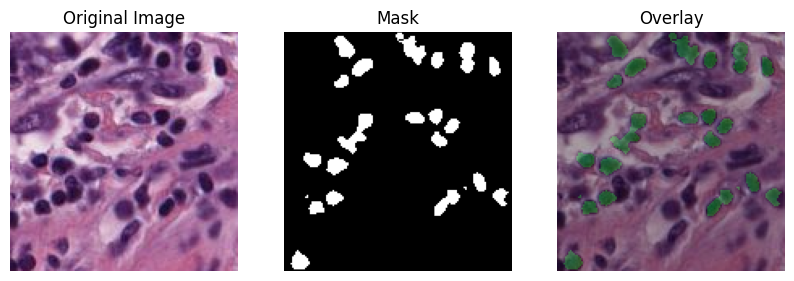

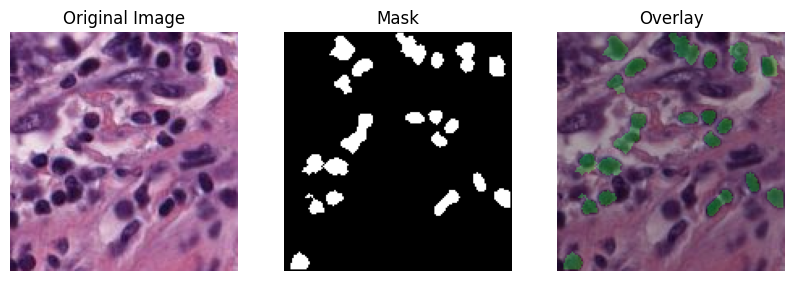

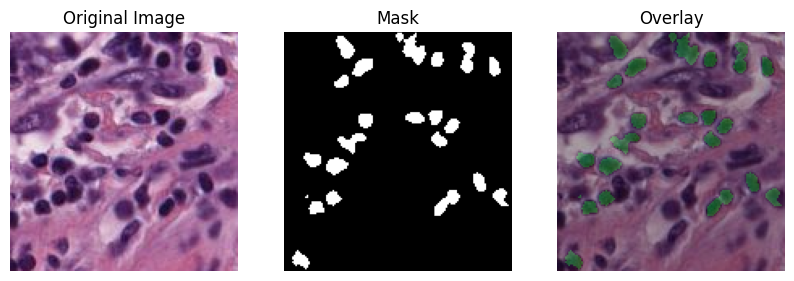

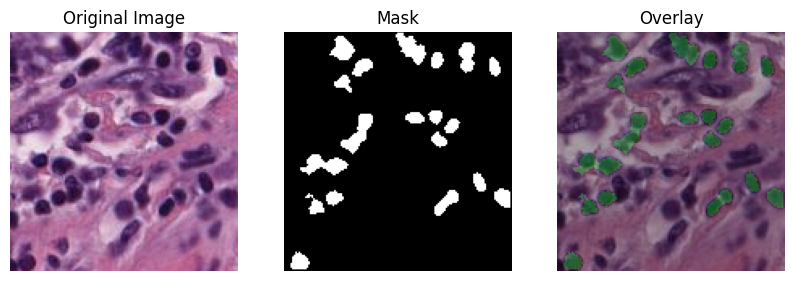

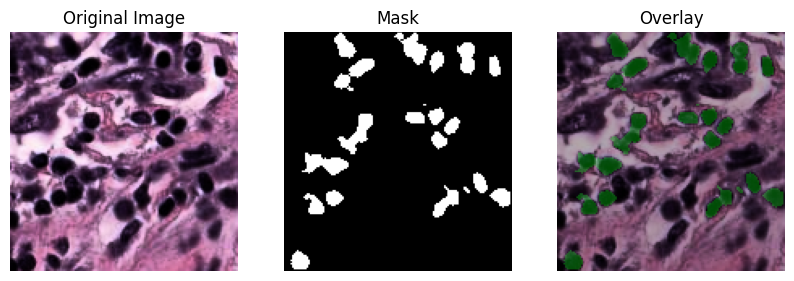

...

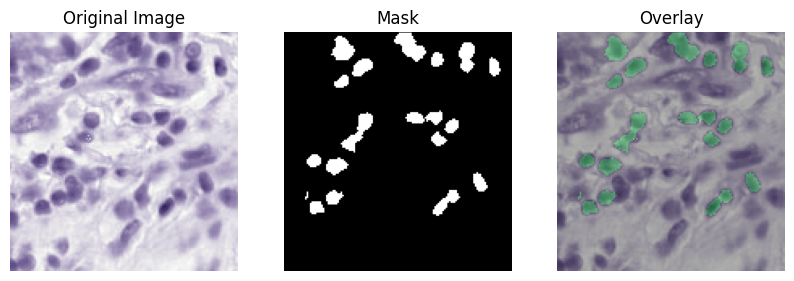

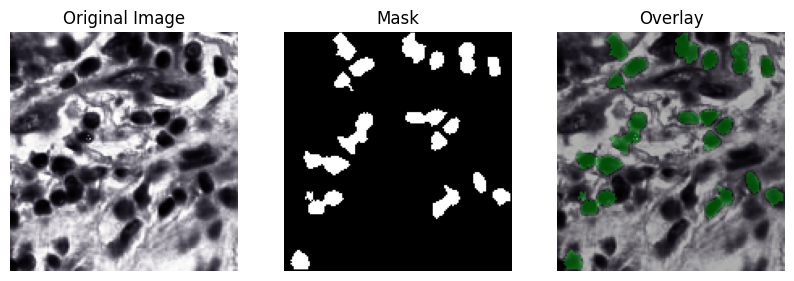

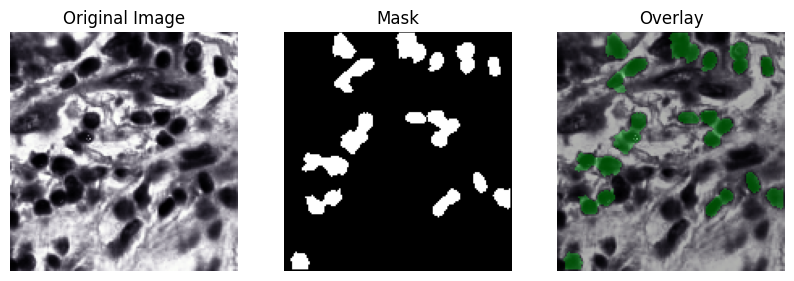

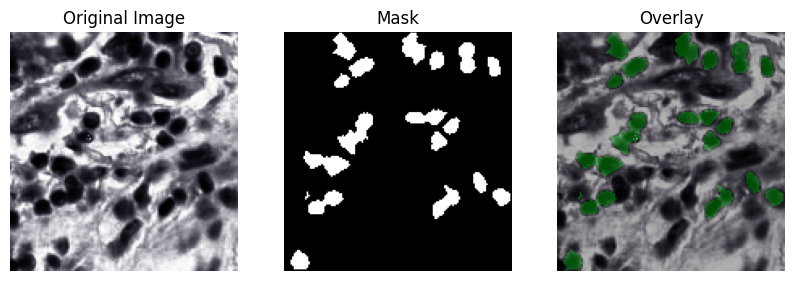

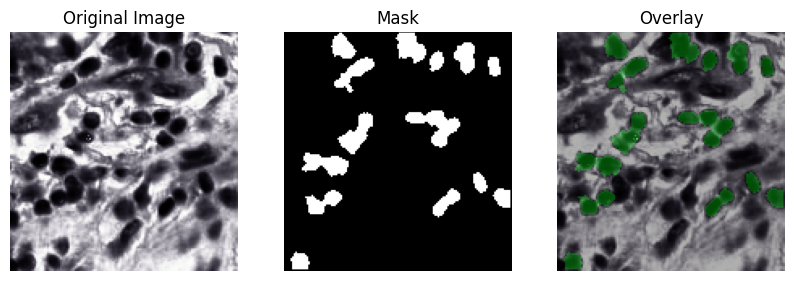

In [9]:
# Define the source folders
source_folders = [("raw", "./data/raw-train/images"), 
                  ("raw_eq", "./data/processed-train/eq"), 
                  ("normalized", "./data/processed-train/normalized"), 
                  ("normalized_eq", "./data/processed-train/normalized_eq"), 
                  ("hematoxylin", "./data/processed-train/hematoxylin"),
                  ("hematoxylin_eq", "./data/processed-train/hematoxylin_eq")]

# Define the operation pipelines
operation_pipelines = [("blur_adaptive", [mo.GAUSSIAN_BLUR, mo.ADAPTIVE_THRESHOLD, mo.COMBINE_MASKS, mo.MORPH_OPENING, mo.MORPH_CLOSING, mo.MARKED_WATERSHED]),
                       ("blur_otsu", [mo.GAUSSIAN_BLUR, mo.OTSU_THRESHOLD, mo.COMBINE_MASKS, mo.MORPH_OPENING, mo.MORPH_CLOSING, mo.MARKED_WATERSHED]),
                       ("adaptive", [mo.ADAPTIVE_THRESHOLD, mo.COMBINE_MASKS, mo.MORPH_OPENING, mo.MORPH_CLOSING, mo.MARKED_WATERSHED]),
                       ("otsu", [mo.OTSU_THRESHOLD, mo.COMBINE_MASKS, mo.MORPH_OPENING, mo.MORPH_CLOSING, mo.MARKED_WATERSHED])]

# Create output folders
parent_dir = "./data/processed-train/masks"
mask_dirs = []
for folder_name, folder_path in source_folders:
    for operation_name, operations in operation_pipelines:
        out_dir = os.path.join(parent_dir, "_".join([folder_name, operation_name]))
        os.makedirs(out_dir, exist_ok=True)
        mask_dirs.append(out_dir)
        generator.set_dir(images_dir=folder_path)
        generator.run(out_dir=out_dir, operations=operations, visualize_range=(12, 13))  # and display 12th image for comparison

## Preprocess train set for the model training

In [10]:
# Set the normalized images to train processor
train_processor.set_images_from_dir("./data/processed-train/normalized")

In [13]:
# Create patches
train_processor.extract_patches(masks_dirs=mask_dirs, out_dir="./data/processed-train/patches")

## Preprocess test set

In [14]:
# Normalize test set
test_processor.normalize(targets, out_dir="./data/processed-test", inplace=True)

[{'img_name': '09_6.png',
  'norm_image': array([[[204, 178, 186],
          [201, 172, 181],
          [198, 167, 175],
          ...,
          [205, 180, 189],
          [205, 180, 189],
          [203, 177, 186]],
  
         [[202, 174, 183],
          [200, 171, 180],
          [198, 167, 175],
          ...,
          [203, 177, 186],
          [203, 177, 186],
          [202, 173, 182]],
  
         [[200, 171, 180],
          [199, 170, 179],
          [198, 168, 176],
          ...,
          [202, 173, 182],
          [202, 173, 182],
          [200, 170, 178]],
  
         ...,
  
         [[205, 178, 185],
          [205, 178, 185],
          [205, 178, 185],
          ...,
          [184, 155, 195],
          [168, 129, 167],
          [194, 166, 191]],
  
         [[205, 178, 185],
          [205, 178, 185],
          [205, 178, 185],
          ...,
          [187, 158, 194],
          [187, 155, 186],
          [197, 169, 187]],
  
         [[205, 178, 185],
          [

In [18]:
# Relabel multiclass masks to binary masks
test_processor.relabel_binary(masks_dir="./data/raw-test/masks", out_dir="./data/processed-test/binary_masks", target_class=2)

In [19]:
# Scale from 40x magnification to 20x magnification
test_processor.scale(masks_dirs=["./data/processed-test/binary_masks"], out_dir="./data/processed-test/scaled", factor=0.5, inplace=True)

In [20]:
# Create patches
test_processor.extract_patches(masks_dirs=["./data/processed-test/scaled/masks"], out_dir="./data/processed-test/patches")

## See some image statistics

In [21]:
from src.image_stats import ImageStats

train_stats = ImageStats("./data/processed-train/patches/images")
test_stats = ImageStats("./data/processed-test/patches/images")

Count: 21879

Average Width: 128.0
Average Height: 128.0
Average image area: 16384.0
Median Width: 128.0
Median Height: 128.0
Median Area: 16384.0
Min Width: 128
Min Height: 128
Min Area: 16384
Max Width: 128
Max Height: 128
Max Area: 16384


{'count': 21879,
 'avg_w': np.float64(128.0),
 'avg_h': np.float64(128.0),
 'avg_area': np.float64(16384.0),
 'med_w': np.float64(128.0),
 'med_h': np.float64(128.0),
 'med_area': np.float64(16384.0),
 'min_w': np.int64(128),
 'min_h': np.int64(128),
 'min_area': np.int64(16384),
 'max_w': np.int64(128),
 'max_h': np.int64(128),
 'max_area': np.int64(16384)}

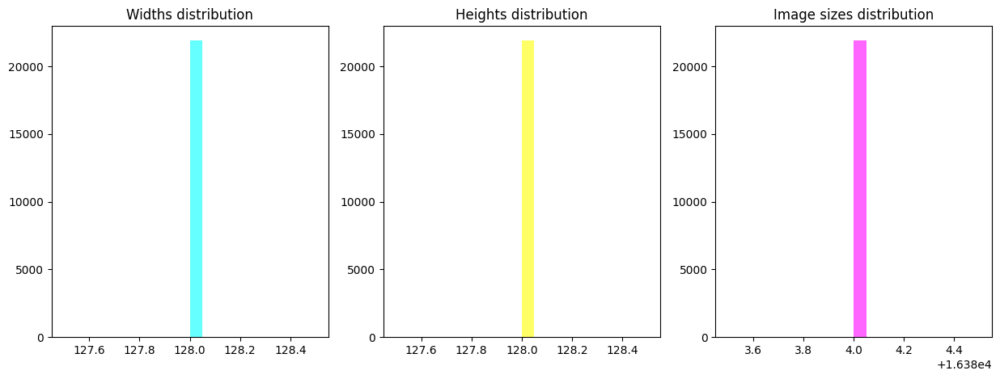

In [23]:
train_stats.get_image_stats(visual=True)

Count: 6649

Average Width: 128.0
Average Height: 128.0
Average image area: 16384.0
Median Width: 128.0
Median Height: 128.0
Median Area: 16384.0
Min Width: 128
Min Height: 128
Min Area: 16384
Max Width: 128
Max Height: 128
Max Area: 16384


{'count': 6649,
 'avg_w': np.float64(128.0),
 'avg_h': np.float64(128.0),
 'avg_area': np.float64(16384.0),
 'med_w': np.float64(128.0),
 'med_h': np.float64(128.0),
 'med_area': np.float64(16384.0),
 'min_w': np.int64(128),
 'min_h': np.int64(128),
 'min_area': np.int64(16384),
 'max_w': np.int64(128),
 'max_h': np.int64(128),
 'max_area': np.int64(16384)}

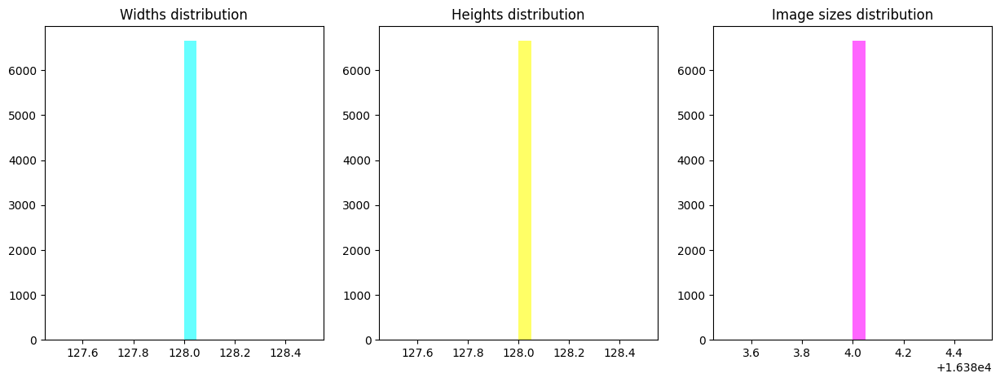

In [24]:
test_stats.get_image_stats(visual=True)